In [1]:
from datasets import load_dataset
import re
from tqdm import tqdm
from matplotlib.gridspec import GridSpec
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
import pandas as pd
from nltk.tokenize import word_tokenize

nltk.download('stopwords')
nltk.download('punkt')
tqdm.pandas()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [1]:
dataset = load_dataset("ahmedheakl/resume-atlas")

df = pd.DataFrame(dataset['train'])

print(df.head())

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/13389 [00:00<?, ? examples/s]

     Category                                               Text
0  Accountant  education omba executive leadership university...
1  Accountant  howard gerrard accountant deyjobcom birmingham...
2  Accountant  kevin frank senior accountant inforesumekraftc...
3  Accountant  place birth nationality olivia ogilvy accounta...
4  Accountant  stephen greet cpa senior accountant 9 year exp...


In [2]:
data_path = "/content/drive/MyDrive/ML DATA/UpdatedResumeDataSet.csv"
df2 = pd.read_csv(data_path)

In [3]:
df2.columns = ['Category', 'Text']

In [4]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 962 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  962 non-null    object
 1   Text      962 non-null    object
dtypes: object(2)
memory usage: 15.2+ KB


In [5]:
df = pd.concat([df, df2])

In [6]:
len(df['Category'].value_counts())

48

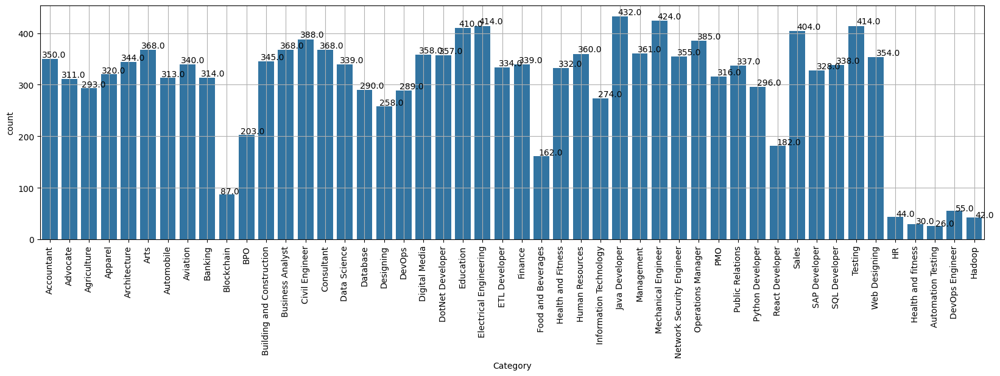

In [7]:

plt.figure(figsize=(20,5))
plt.xticks(rotation=90)
ax=sns.countplot(x="Category", data=df)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.grid()

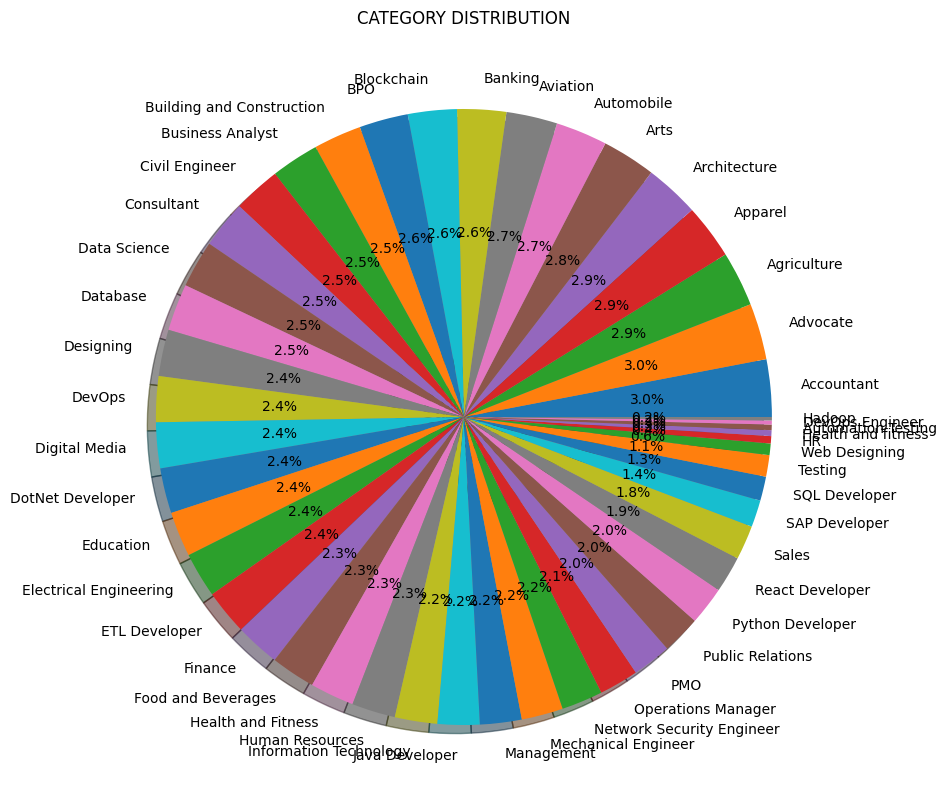

In [8]:
targetCounts = df['Category'].value_counts()
targetLabels  = df['Category'].unique()
# Make square figures and axes
plt.figure(1, figsize=(22,22))
the_grid = GridSpec(2, 2)


cmap = plt.get_cmap('coolwarm')
plt.subplot(the_grid[0, 1], aspect=1, title='CATEGORY DISTRIBUTION')

source_pie = plt.pie(targetCounts, labels=targetLabels, autopct='%1.1f%%', shadow=True)
plt.show()

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14351 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  14351 non-null  object
 1   Text      14351 non-null  object
dtypes: object(2)
memory usage: 336.4+ KB


CLEANING AND PREPROCESSING

In [11]:
df.drop_duplicates(subset=['Text'], keep='first',inplace = True)
df.reset_index(inplace=True,drop=True)
df.head()

,Category,Text
0,Accountant,education omba executive leadership university...
1,Accountant,howard gerrard accountant deyjobcom birmingham...
2,Accountant,kevin frank senior accountant inforesumekraftc...
3,Accountant,place birth nationality olivia ogilvy accounta...
4,Accountant,stephen greet cpa senior accountant 9 year exp...


In [12]:
len(df)

12251

In [13]:
def clean(text):


    # Compile patterns for URLs and emails to speed up cleaning process
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    email_pattern = re.compile(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Z|a-z]{2,}\b')

    # Remove URLs
    clean_text = url_pattern.sub('', text)

    # Remove emails
    clean_text = email_pattern.sub('', clean_text)

    # Remove special characters (keeping only words and whitespace)
    clean_text = re.sub(r'[^\w\s]', '', clean_text)
    clean_text = re.sub(r'[^\x00-\x7f]', '', clean_text)  # https://stackoverflow.com/questions/20889996/how-do-i-remove-all-non-ascii-characters-with-regex-and-notepad no ascii
    return clean_text


df['Text'] = df['Text'].progress_apply(lambda x: clean(x))

100%|██████████| 12251/12251 [00:02<00:00, 4272.03it/s]


In [15]:
# clean consecutive numbers which give us no information whatsoever
def clean_resume(resume_text):
    modified_text = re.sub(r'\b\d{3,}\b', '', resume_text)
    return modified_text
df['Text'] = df['Text'].progress_apply(lambda x: clean_resume(x))

100%|██████████| 12251/12251 [00:03<00:00, 3495.24it/s]


In [17]:
print('Count of null values from category column:', df['Category'].isnull().sum())
print('Count of null values from resume column:', df['Text'].isnull().sum(), '\n')

print(df.describe())

Count of null values from category column: 0
Count of null values from resume column: 0 

         Category                                               Text
count       12251                                              12251
unique         48                                              12250
top     Education  roger kuo  sansome st  san francisco ca  roger...
freq          388                                                  2


In [3]:
list_tech = ['Java Developer', 'Testing', 'DevOps Engineer', 'Python Developer',
             'Web Designing', 'ETL Developer', 'Data Science', 'SAP Developer',
             'Network Security Engineer', 'Automation Testing', 'DotNet Developer',
             'Hadoop', 'Database', 'Blockchain']

df['Category Area'] = None
df['Category Area'] = df['Category'].apply(lambda category: 'Tech' if category in list_tech else 'Others')

# Sorting columns
df = df.reindex(columns=['Category', 'Category Area', 'Text'])
df.head()

,Category,Category Area,Text
0,Accountant,Others,education omba executive leadership university...
1,Accountant,Others,howard gerrard accountant deyjobcom birmingham...
2,Accountant,Others,kevin frank senior accountant inforesumekraftc...
3,Accountant,Others,place birth nationality olivia ogilvy accounta...
4,Accountant,Others,stephen greet cpa senior accountant 9 year exp...


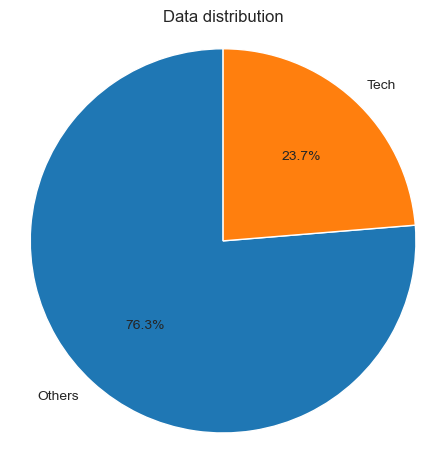

In [4]:
category_counts = df['Category Area'].value_counts()

fig, ax = plt.subplots()
ax.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.get_cmap('tab10').colors)
ax.axis('equal')

ax.set_title('Data distribution')

fig.set_size_inches(5.5, 5.5)

# Show the plot
plt.show()

აქ მცირე დატა ვიზუალიზაცია, რომ ვნახოთ დატის განაწილება უკეთესად.

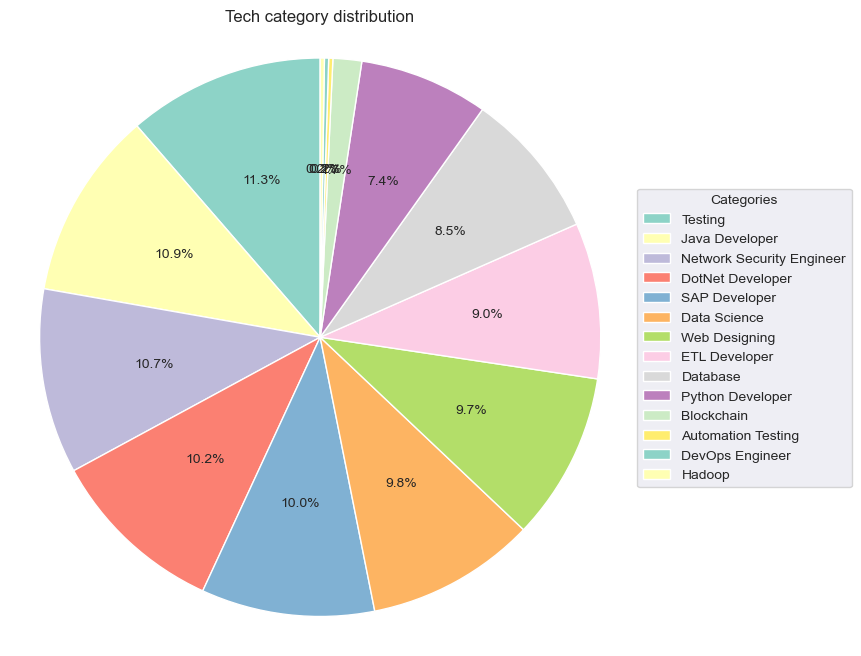

In [9]:
tech_counts = df[df['Category Area'] == 'Tech']['Category'].value_counts()

colors = plt.get_cmap('Set3').colors[:len(tech_counts)]

fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(tech_counts, autopct='%1.1f%%', startangle=90, colors=colors)
ax.set_title('Tech category distribution')
ax.axis('equal')

ax.legend(wedges, tech_counts.index, title="Categories", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

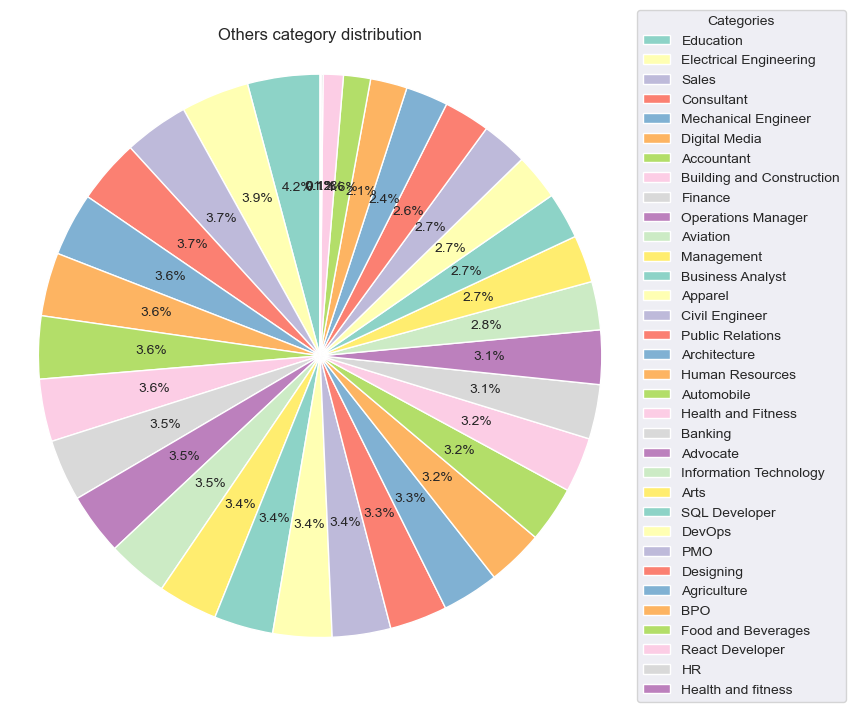

In [10]:
others_counts = df[df['Category Area'] == 'Others']['Category'].value_counts()

colors = plt.get_cmap('Set3').colors[:len(others_counts)]

fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(others_counts, autopct='%1.1f%%', startangle=90, colors=colors)
ax.set_title('Others category distribution')
ax.axis('equal')

ax.legend(wedges, others_counts.index, title="Categories", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

In [23]:

stopwords = set(stopwords.words('english'))

def remove_stopwords(tokens):
  token_list = []
  for i in tokens:
      if i.lower() not in stopwords:
        token_list.append(i)
  return token_list
def tokenize(text):
  tokens = word_tokenize(text)
  return tokens
def process_nltk(resume):
  tokens = tokenize(resume)
  tokens = remove_stopwords(tokens)
  text = ' '.join(tokens)
  return text
df['Text'] = df['Text'].apply(lambda x: process_nltk(x))



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [24]:
df.to_csv('/content/drive/MyDrive/ML DATA/finalized_data.csv')

ახლა უნდა გავაკეთოთ თვითონ ტექსტების ანალიზი. ანუ, სიგრძე, სიტყვების სიხშირეები და ა.შ. რაც შემდგომ უფრო დამეხმარება მოდელინგისას

In [23]:
df['len_words'] = df['Text'].progress_apply(lambda x: len(x.split()))

100%|██████████| 12251/12251 [00:00<00:00, 68259.00it/s]


In [24]:
df['len_words'].describe()

count    12251.000000
mean       457.507959
std        314.636707
min          5.000000
25%        229.000000
50%        376.000000
75%        595.000000
max       6369.000000
Name: len_words, dtype: float64

In [25]:
df[df['len_words'] < 30]

,Unnamed: 0,Category,Category Area,Text,len_words
133,133,Advocate,Others,glenn alynn brand advocate 10 proficiency rele...,8
882,882,Database,Tech,phillip l waterman database management educati...,25
1809,1809,Mechanical Engineer,Others,rg summary mechanical engineer professional ex...,19
2574,2574,Advocate,Others,memberships work experiece june 2010present pa...,23
2620,2620,Agriculture,Others,agriculture natural resources perfect resume,5
2630,2630,Agriculture,Others,contact expertise susan j adams agricultural c...,12
2631,2631,Agriculture,Others,martina r reed agriculture specialist career o...,15
2638,2638,Agriculture,Others,alzaz ul haq bsc agricultural engineer camer o...,9
2771,2771,Architecture,Others,robert smith java architect 1 personal stateme...,26
2919,2919,Aviation,Others,armando k johnston pilot contacts career objec...,11


In [26]:
for i, row in df[df['len_words'] < 30].iterrows():
    print(row['Text'])
    print("*" * 50)
    

glenn alynn brand advocate 10 proficiency relevant skills
**************************************************
phillip l waterman database management education bachelors degree database administration unity ny professional skills city contrapecifications twit smesandro adding identification impact managed backup recovery proces
**************************************************
rg summary mechanical engineer professional experience mechanical engineer enforce strict adherence studies contact education relevant skills matworks matlab acad
**************************************************
memberships work experiece june 2010present panel advocatelawyer manger legal tv p 4 cy march 2007p al anwar human advocates soci court law fi
**************************************************
agriculture natural resources perfect resume
**************************************************
contact expertise susan j adams agricultural consultant career objective related skills toplatenge
******************

კაი, აქიდან უმეტესობა ძალიან არაფრის მომცემია, შეგვიძლია პირდაპირ გადავაგდოთ.

In [27]:
df = df[df['len_words'] >= 30]

In [28]:
df[df['len_words'] > 1_000]

,Unnamed: 0,Category,Category Area,Text,len_words
5246,5246,Accountant,Others,jessica claire montgomery st 10th floor resume...,1109
5280,5280,Accountant,Others,jessica claire montgomery street san francisco...,2186
5302,5302,Accountant,Others,professional summary jessica claire montgomery...,1725
5356,5356,Accountant,Others,jessica claire montgomery st 10th floor resume...,1054
5386,5386,Accountant,Others,education training activities honors summary j...,1460
...,...,...,...,...,...
12080,12080,Web Designing,Tech,jessica claire montgomery street san francisco...,1206
12163,12163,Business Analyst,Others,Skills Area Exposure Modeling Tool Bizagi MS V...,1061
12184,12184,Operations Manager,Others,Education Details BCA Vinayaka Missions Univer...,1221
12186,12186,Operations Manager,Others,SKILLS Well versed MS Office Internet Applicat...,1244


ძალიან ხშირად არის ნასხსენები ვიღაც jessica claire montgomery, უნდა მოვაშოროთ რომ არ მივაჩვიოთ მოდელი ასეთ ინფუთს :დ

In [29]:
def clean_text_of_jessica_montgomery(text):
    remove1 = "jessica claire montgomery st 10th floor resumesampleexamplecom"
    remove2 = "jessica claire montgomery street san francisco ca resumesampleexamplecom"
    
    cleaned_text = text.replace(remove1, "").replace(remove2, "")
    return cleaned_text
df['Text'] = df['Text'].progress_apply(lambda x: clean_text_of_jessica_montgomery(x))
df['len_words'] = df['Text'].progress_apply(lambda x: len(x.split()))
df['len_words'].describe()

100%|██████████| 12231/12231 [00:00<00:00, 67522.56it/s]


count    12231.000000
mean       455.188946
std        312.676680
min         31.000000
25%        229.000000
50%        375.000000
75%        590.000000
max       6362.000000
Name: len_words, dtype: float64

In [30]:
df[df['len_words'] > 2_000]

,Unnamed: 0,Category,Category Area,Text,len_words
5280,5280,Accountant,Others,summary financial accountant specializing fin...,2178
5922,5922,Architecture,Others,professional summary skills job title success...,2287
6054,6054,Arts,Others,jessica claire resumesampleexamplecom montgome...,4952
6473,6473,Aviation,Others,summary highly efficient personnel manager of...,2726
6734,6734,Blockchain,Tech,summary industrious founder experience genera...,6362
6816,6816,BPO,Others,summary proactive bilingual credit analyst we...,2846
6934,6934,Building and Construction,Others,summary experienced heavy equipment operator ...,2193
7363,7363,Civil Engineer,Others,summary civil structural engineering manager ...,2390
7540,7540,Consultant,Others,professional summary accomplished professiona...,2213
7606,7606,Data Science,Tech,professional summary skills data science lead...,2236


იდეაში, შეგვიძლია ძალიან დიდი ინფუთები დავტოვოთ. როგორც ავღნიშნე, ზოგ მოდელში ეგ პრობლემა არ იქნება, თუმცა transformer-ებში იქნება, დიდ ინფუთს ვერ დავაპროცესებთ. ამიტომ, TRUNCATION-ის გამოყენება მოგვიწევს რაც არ ვიცი რამდენად გამართლებული იქნება, თუმცა იმედი მაქვს, რომ პირველ 512 ტოკენში მთავარი აზრი გამოჩნდება.

უკეთესი ვიზუალიზაციისთვის შევხედოთ როგორ გამოიყურება სიტყვების სიხშირეები თითოეუელი კატეგორიის მქონე რეზიუმესთვის.


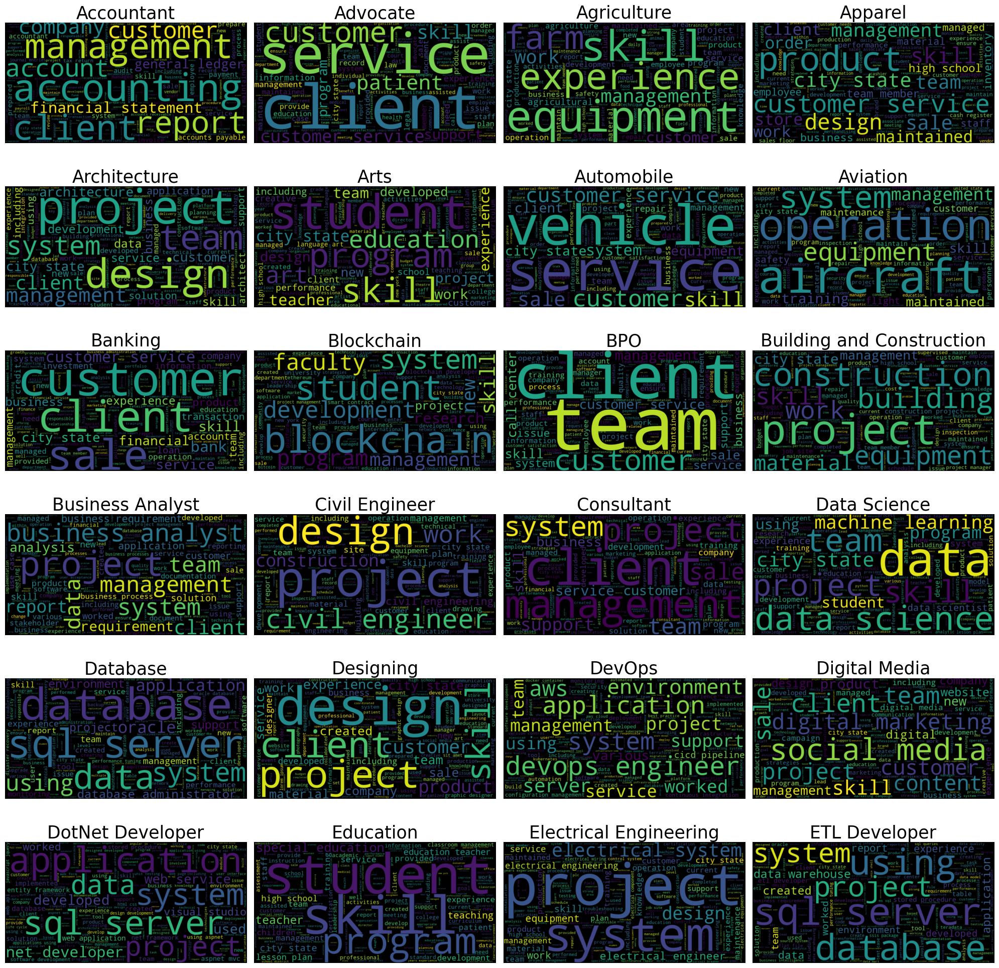

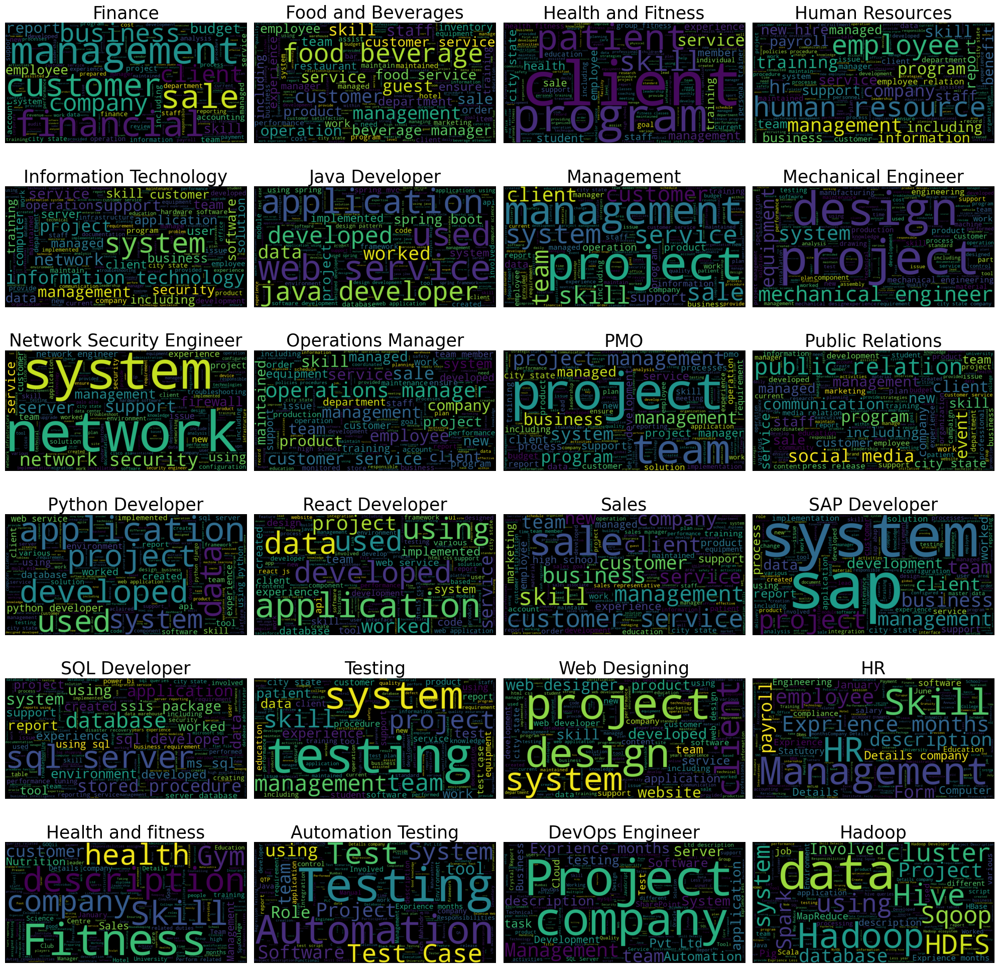

In [44]:
from wordcloud import WordCloud
def create_wordcloud(df):
    txt = ' '.join(text for text in df['Text'])
    wc = WordCloud(width=800, height=400).generate(txt)
    return wc

categories = df['Category'].unique().tolist()

subplots_per_figure = 24
num_figures = (len(categories) + subplots_per_figure - 1) // subplots_per_figure

for fig_index in range(num_figures):
    plt.figure(figsize=(20, 20))
    start_index = fig_index * subplots_per_figure
    end_index = min((fig_index + 1) * subplots_per_figure, len(categories))
    for i, category in enumerate(categories[start_index:end_index], 1):
        plt.subplot(6, 4, i)  # Adjust grid size accordingly
        sample_df = df[df['Category'] == category]
        wc = create_wordcloud(sample_df)
        plt.title(category, fontsize=25)
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

აქიდან საკმაოდ კარგად ჩანს ისე მემგონი, რომელი ლეიბლები შეიძლება გაუჭირდეს მოდელს. ძალიან "გაბნეული" როცა არის სიტყვების სიხშირეები (operations manager) შედარებით რთული იქნება მოდელისთის ვიდრე მაგალითად "health and fitness".

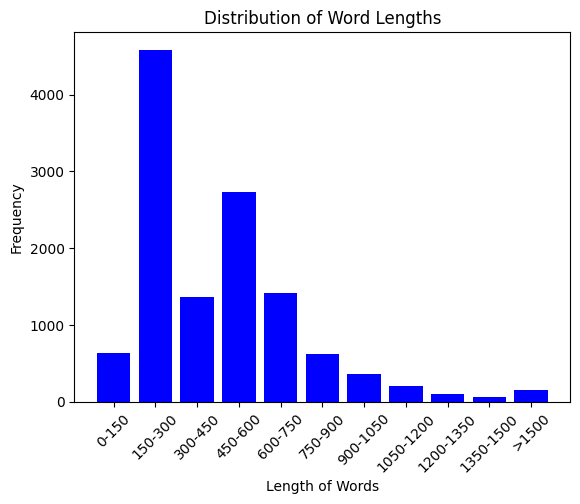

In [45]:
bins = list(range(0, 1501, 150))  # 0-150, 150-300, ..., 1350-1500
bins.append(float('inf'))
labels = [f'{bins[i]}-{bins[i+1]}' for i in range(len(bins)-2)] + ['>1500']

# Categorizing the data into bins
df['binned'] = pd.cut(df['len_words'], bins=bins, labels=labels, right=False)

# Creating the bar plot
plot_data = df['binned'].value_counts().sort_index()
plt.bar(plot_data.index, plot_data.values, color='blue')
plt.xlabel('Length of Words')
plt.ylabel('Frequency')
plt.title('Distribution of Word Lengths')
plt.xticks(rotation=45)
plt.show()

ეს საკმაოდ კარგი ნიუსია, ანუ უმეტესობა 1000 სიტყვაზე ნაკლებშია მოქცეული და truncation-ით მინიმუმ ნახევარს მაინც დავიჭერ ვგონებ.

აქ უნდა დავასრულო ჩვენი EDA, საკმაოდ საინტერესო დატაა და მგონია რომ ტრეინინგის ფაზა კიდევ უფრო საინტერესო გამოვა.

In [51]:
df.to_csv('data_for_training.csv')
